# **Load KVASIR Dataset**

In [1]:
!wget 'https://datasets.simula.no/downloads/kvasir/kvasir-dataset.zip'

--2024-12-28 21:05:42--  https://datasets.simula.no/downloads/kvasir/kvasir-dataset.zip
Resolving datasets.simula.no (datasets.simula.no)... 128.39.36.14
Connecting to datasets.simula.no (datasets.simula.no)|128.39.36.14|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1236208343 (1.2G) [application/zip]
Saving to: ‘kvasir-dataset.zip’

kvasir-dataset.zip  100%[===================>]   1.15G  22.1MB/s    in 57s     

2024-12-28 21:06:39 (20.7 MB/s) - ‘kvasir-dataset.zip’ saved [1236208343/1236208343]



###Unzip Dataset

In [2]:
!unzip -xq kvasir-dataset.zip

### Load Libraries for spliting data

In [3]:
import os
import shutil
from sklearn.model_selection import train_test_split

### Try spliting data

In [4]:
train_dir = os.path.join("kvasir-split", "train")
test_dir = os.path.join("kvasir-split", "test")
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

for class_name in os.listdir("kvasir-dataset"):  # لیست تمام کلاس‌ها (نام پوشه‌ها) در دیتاست اصلی می گیرد.
    class_path = os.path.join("kvasir-dataset", class_name)
    if not os.path.isdir(class_path):
        continue

    files = [os.path.join(class_path, f) for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
    print(f"Processing class: {class_name}, Files found: {len(files)}")

    if len(files) == 0:
        print(f"Skipping empty class directory: {class_name}")
        continue

    train_files, test_files = train_test_split(files, train_size=0.8, random_state=42)

    train_class_dir = os.path.join(train_dir, class_name)
    test_class_dir = os.path.join(test_dir, class_name)
    os.makedirs(train_class_dir, exist_ok=True)
    os.makedirs(test_class_dir, exist_ok=True)

    for file_path in train_files:
        shutil.copy(file_path, train_class_dir)
    for file_path in test_files:
        shutil.copy(file_path, test_class_dir)

Processing class: ulcerative-colitis, Files found: 500
Processing class: polyps, Files found: 500
Processing class: dyed-lifted-polyps, Files found: 500
Processing class: dyed-resection-margins, Files found: 500
Processing class: normal-pylorus, Files found: 500
Processing class: normal-z-line, Files found: 500
Processing class: esophagitis, Files found: 500
Processing class: normal-cecum, Files found: 500


### Load TensorFlow Library and Data Augmentation and Data Normalization

In [5]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator # پیش پردازش
from tensorflow.keras import layers, models

train_datagen = ImageDataGenerator(
    rescale=1./255,  # نرمال سازی داده ها بین [0, 1]
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True # برای تنوع دادن به داده ها
)

test_datagen = ImageDataGenerator(rescale=1./255)

### Flow the images from the directories

In [6]:
train_generator = train_datagen.flow_from_directory(
    "kvasir-split/train",
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    "kvasir-split/test",
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

Found 3200 images belonging to 8 classes.
Found 800 images belonging to 8 classes.


### Build the CNN model

In [ ]:
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=((224, 224)[0], (224, 224)[1], 3)),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(train_generator.num_classes, activation='softmax') # تعداد نورون های خارجی برابر با تعداد کلاس
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


### Compile the Model

In [ ]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,992 (42.61 MB)

 Trainable params: 11,169,992 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

### Train the model

In [ ]:
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=test_generator
)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 73s 666ms/step - accuracy: 0.4010 - loss: 1.4847 - val_accuracy: 0.6237 - val_loss: 0.8008
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 81s 662ms/step - accuracy: 0.6204 - loss: 0.8368 - val_accuracy: 0.6662 - val_loss: 0.7138
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 652ms/step - accuracy: 0.6830 - loss: 0.6862 - val_accuracy: 0.6488 - val_loss: 0.7017
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 652ms/step - accuracy: 0.6818 - loss: 0.7149 - val_accuracy: 0.7212 - val_loss: 0.6206
Epoch 5/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 639ms/step - accuracy: 0.7109 - loss: 0.6350 - val_accuracy: 0.6413 - val_loss: 0.7393
Epoch 6/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 81s 643ms/step - accuracy: 0.7043 - loss: 0.6634 - val_accuracy: 0.7075 - val_loss: 0.6211
Epoch 7/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 82s 647ms/step - accuracy: 0.7408 - loss: 0.5678 - val_accuracy: 0.6950 - val_loss: 0.6604
Epoch 8/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 83s 645ms/step - accuracy: 0.7509 - loss: 0.5670 - val

### Plot the accuracy and loss

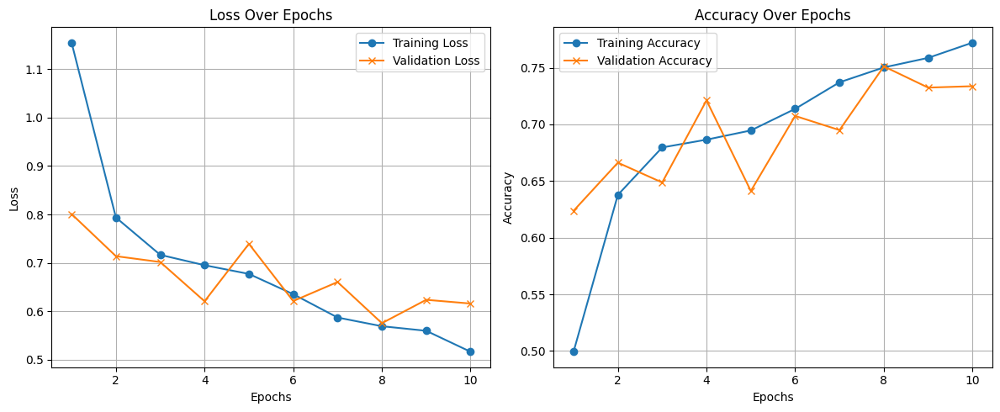

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, len(history.history['loss']) + 1)
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, loss, label='Training Loss', marker='o')
plt.plot(epochs, val_loss, label='Validation Loss', marker='x')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, accuracy, label='Training Accuracy', marker='o')
plt.plot(epochs, val_accuracy, label='Validation Accuracy', marker='x')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### Evaluate the model on the test set

In [ ]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 269ms/step - accuracy: 0.7246 - loss: 0.6403
Test accuracy: 0.7337


### Plot some

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

test_images, test_labels = next(test_generator)

predictions = model.predict(test_images)

predicted_classes = np.argmax(predictions, axis=1)

# Get the actual class labels
true_classes = np.argmax(test_labels, axis=1)

# Define the class labels
class_labels = list(test_generator.class_indices.keys())

# Plot
plt.figure(figsize=(20, 20))

for i in range(min(30, len(test_images))):
    plt.subplot(5, 6, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    plt.title(f"True: {class_labels[true_classes[i]]}\nPred: {class_labels[predicted_classes[i]]}", fontsize=8)

plt.tight_layout()
plt.show()


###Libraries

In [8]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam

## Fine Tune

### Load pre-trained ResNet50 model without the top classification layers


In [9]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

base_model.trainable = True

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


### Create the model by adding custom layers on top

In [10]:
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(train_generator.num_classes, activation='softmax')
])


### Compile the model

In [11]:
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 8)                   │           2,056 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,114,312 (91.99 MB)

 Trainable params: 24,061,192 (91.79 MB)

 Non-trainable params: 53,120 (207.50 KB)

### Train the model on the custom top layers




In [12]:
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=test_generator
)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


100/100 ━━━━━━━━━━━━━━━━━━━━ 150s 790ms/step - accuracy: 0.5691 - loss: 1.1746 - val_accuracy: 0.2138 - val_loss: 2.1948
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 105s 754ms/step - accuracy: 0.8939 - loss: 0.3058 - val_accuracy: 0.1550 - val_loss: 2.6611
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 82s 754ms/step - accuracy: 0.9199 - loss: 0.2255 - val_accuracy: 0.1312 - val_loss: 3.2832
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 79s 751ms/step - accuracy: 0.9472 - loss: 0.1510 - val_accuracy: 0.1287 - val_loss: 3.3303
Epoch 5/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 81s 730ms/step - accuracy: 0.9494 - loss: 0.1438 - val_accuracy: 0.1550 - val_loss: 2.5048
Epoch 6/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 78s 734ms/step - accuracy: 0.9553 - loss: 0.1338 - val_accuracy: 0.2113 - val_loss: 2.7252
Epoch 7/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 82s 735ms/step - accuracy: 0.9553 - loss: 0.1415 - val_accuracy: 0.2275 - val_loss: 3.6053
Epoch 8/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 82s 745ms/step - accuracy: 0.9665 - loss: 0.1016 - v

### Plot accuracy and loss


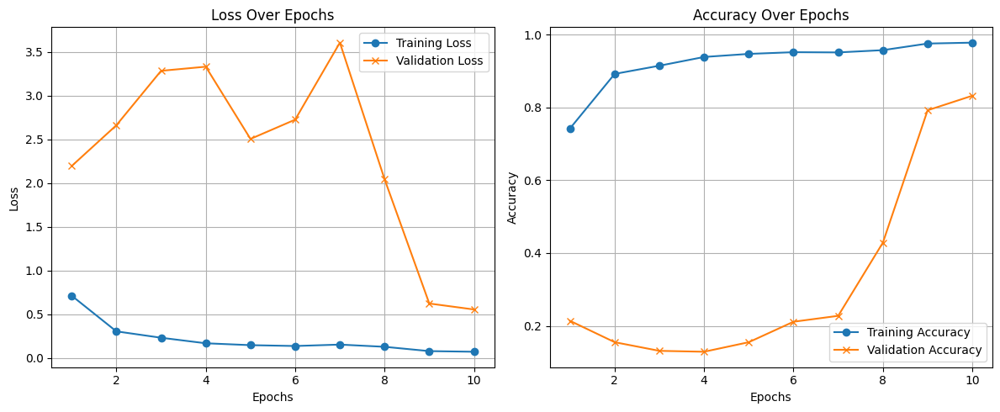

In [13]:
import matplotlib.pyplot as plt

epochs = range(1, len(history.history['loss']) + 1)
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, loss, label='Training Loss', marker='o')
plt.plot(epochs, val_loss, label='Validation Loss', marker='x')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, accuracy, label='Training Accuracy', marker='o')
plt.plot(epochs, val_accuracy, label='Validation Accuracy', marker='x')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### Evaluate the model on the test set

In [14]:
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 337ms/step - accuracy: 0.8212 - loss: 0.6071
Test accuracy: 0.8325


### Plot some

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


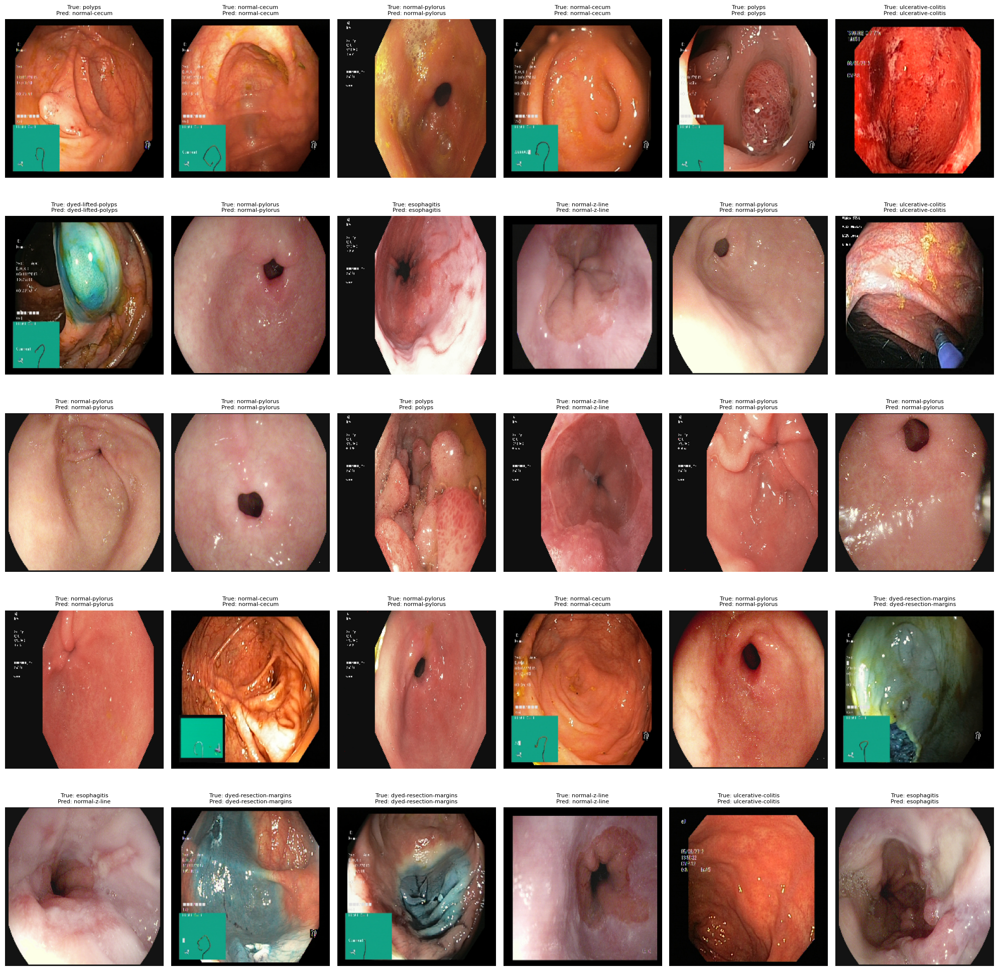

In [16]:
import numpy as np
test_images, test_labels = next(test_generator)

predictions = model.predict(test_images)

predicted_classes = np.argmax(predictions, axis=1)

# Get the actual class labels
true_classes = np.argmax(test_labels, axis=1)

# Define the class labels
class_labels = list(test_generator.class_indices.keys())

# Plot
plt.figure(figsize=(20, 20))

for i in range(min(30, len(test_images))):
    plt.subplot(5, 6, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    plt.title(f"True: {class_labels[true_classes[i]]}\nPred: {class_labels[predicted_classes[i]]}", fontsize=8)

plt.tight_layout()
plt.show()


## Transfer Learning

In [17]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
base_model.trainable = False

# Create the model by adding custom layers on top
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(train_generator.num_classes, activation='softmax')
])

### Compile model

In [18]:
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Model summary
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 8)                   │           2,056 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,114,312 (91.99 MB)

 Trainable params: 526,600 (2.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

### Train the model

In [19]:
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=test_generator
)

test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 82s 685ms/step - accuracy: 0.1281 - loss: 2.3579 - val_accuracy: 0.2087 - val_loss: 2.0390
Epoch 2/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 657ms/step - accuracy: 0.1549 - loss: 2.1008 - val_accuracy: 0.2013 - val_loss: 2.0188
Epoch 3/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 83s 678ms/step - accuracy: 0.1635 - loss: 2.0558 - val_accuracy: 0.2400 - val_loss: 1.9872
Epoch 4/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 73s 689ms/step - accuracy: 0.1946 - loss: 2.0121 - val_accuracy: 0.2562 - val_loss: 1.9594
Epoch 5/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 660ms/step - accuracy: 0.2130 - loss: 1.9932 - val_accuracy: 0.2562 - val_loss: 1.9390
Epoch 6/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 82s 658ms/step - accuracy: 0.2273 - loss: 1.9720 - val_accuracy: 0.2562 - val_loss: 1.9193
Epoch 7/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 656ms/step - accuracy: 0.2375 - loss: 1.9486 - val_accuracy: 0.2637 - val_loss: 1.8968
Epoch 8/10
100/100 ━━━━━━━━━━━━━━━━━━━━ 69s 651ms/step - accuracy: 0.2565 - loss: 1

### Plot accuracy and loss

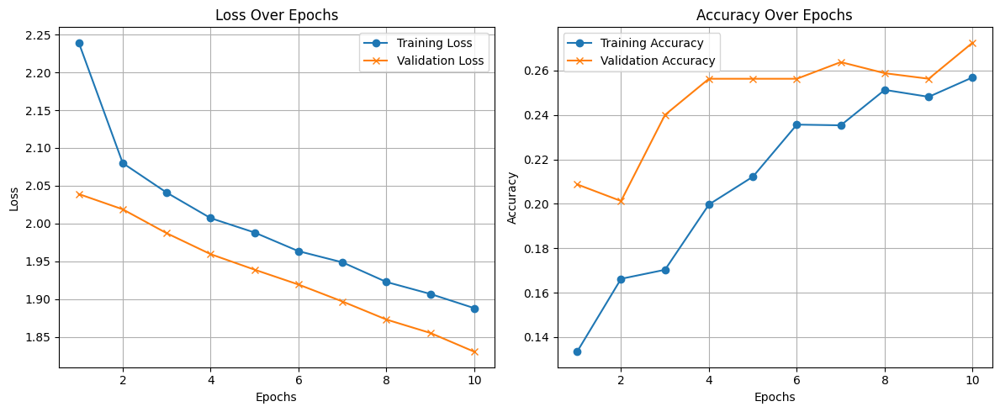

In [20]:
import matplotlib.pyplot as plt

epochs = range(1, len(history.history['loss']) + 1)
loss = history.history['loss']
val_loss = history.history['val_loss']
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, loss, label='Training Loss', marker='o')
plt.plot(epochs, val_loss, label='Validation Loss', marker='x')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, accuracy, label='Training Accuracy', marker='o')
plt.plot(epochs, val_accuracy, label='Validation Accuracy', marker='x')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### Plot some instances

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


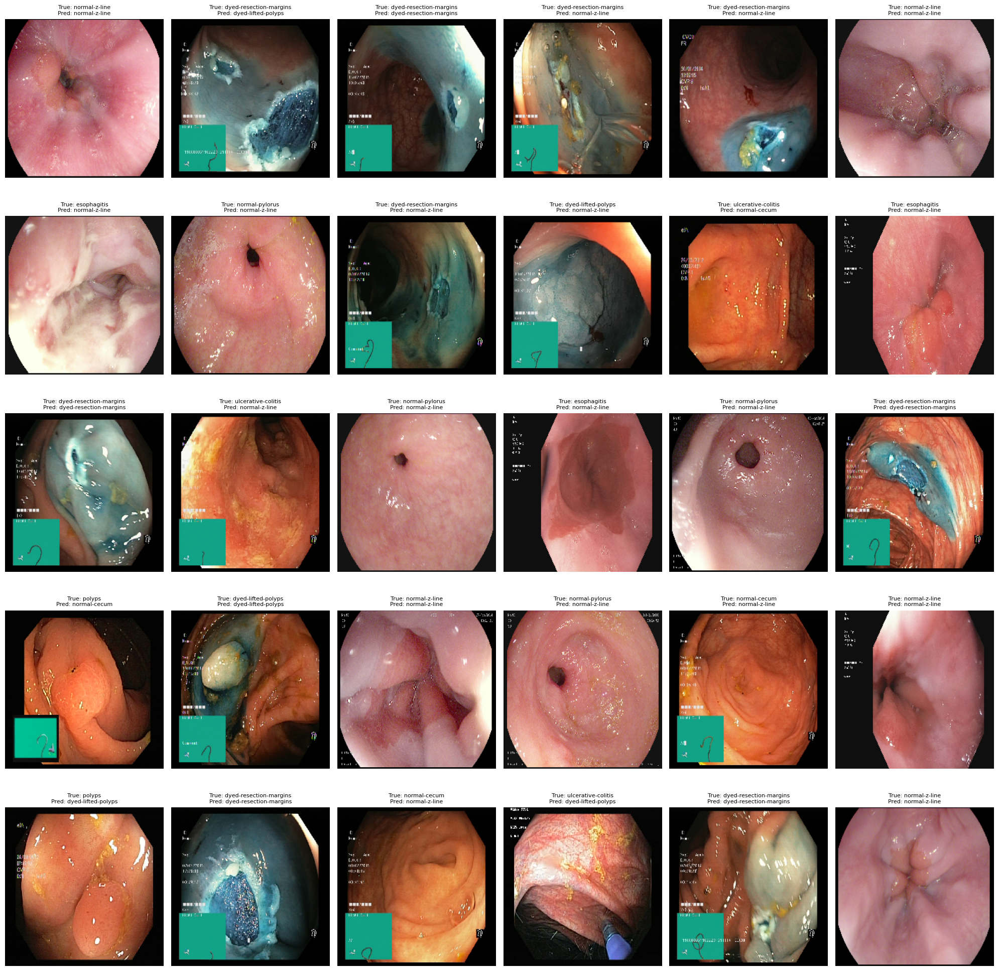

In [21]:
import numpy as np
import matplotlib.pyplot as plt

test_images, test_labels = next(test_generator)

predictions = model.predict(test_images)

predicted_classes = np.argmax(predictions, axis=1)

# Get the actual class labels
true_classes = np.argmax(test_labels, axis=1)

# Define the class labels
class_labels = list(test_generator.class_indices.keys())

# Plot
plt.figure(figsize=(20, 20))

for i in range(min(30, len(test_images))):
    plt.subplot(5, 6, i + 1)
    plt.imshow(test_images[i])
    plt.axis('off')
    plt.title(f"True: {class_labels[true_classes[i]]}\nPred: {class_labels[predicted_classes[i]]}", fontsize=8)

plt.tight_layout()
plt.show()
